In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

RANDOM_STATE = 123

In [2]:
smt_2020_df = pd.read_excel('data/I11_SMT Incidents 2020.xlsx')

smt_2020_df.columns = smt_2020_df.iloc[11].values
smt_2020_df = smt_2020_df.iloc[12:]
smt_2020_df = smt_2020_df.reset_index(drop=True)


c:\ProgramData\Anaconda3\lib\site-packages\openpyxl\styles\stylesheet.py:221: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")


In [3]:
smt_2021_df = pd.read_excel('data/I11_SMT Incidents 2021.xlsx')

smt_2021_df.columns = smt_2021_df.iloc[11].values
smt_2021_df = smt_2021_df.iloc[12:]
smt_2021_df = smt_2021_df.reset_index(drop=True)

In [4]:
smt_2022_df = pd.read_excel('data/I11_SMT Incidents 2022.xlsx')

smt_2022_df.columns = smt_2022_df.iloc[11].values
smt_2022_df = smt_2022_df.iloc[12:]
smt_2022_df = smt_2022_df.reset_index(drop=True)

In [5]:
smt_df = pd.concat([smt_2020_df, smt_2021_df, smt_2022_df])
smt_df.reset_index(drop=True,inplace=True)

pd.set_option('display.max_columns', None)

In [6]:
celonis_2020_df = pd.read_excel('data/Tickets_Celonis_2020.xlsx')
celonis_2020_df = celonis_2020_df.reset_index(drop=True)

In [7]:
celonis_2021_df = pd.read_excel('data/Tickets_Celonis_2021.xlsx')
celonis_2021_df = celonis_2021_df.reset_index(drop=True)

In [8]:
celonis_2022_df = pd.read_excel('data/Tickets_Celonis_2022.xlsx')
celonis_2022_df = celonis_2022_df.reset_index(drop=True)

In [9]:
celonis_df = pd.concat([celonis_2020_df, celonis_2021_df, celonis_2022_df])
celonis_df.reset_index(drop=True,inplace=True)

In [10]:
#Posibles a borrar ['Current Incident Type', 'Region', 'Impact', 'Site','Product Categorization Tier 1', 'Resolution Categorization Tier 1', 'Resolution Categorization Tier 2', ]
#Posibles a no borrar ['Customer Department', 'Primary Center Code']

no_borrados_para_analisis = ['Status Reason', 'Customer Department', 'Desk Location', 'Impact', 'Service+', 'CI+', 'Resolution Categorization Tier 3', 'Desk Location']

smt_df_clean = smt_df.drop(['Original Incident Number', 'Requisition ID', 'Created Date (UTC+0)', 'Status', 'Customer Department', 'Summary', 'In Progess Time (hhh:mi)\n', 'Actual Duration/Open Time (hhh:mi)',
                                         'Down Time of CI-Unavailability (hhh:mi)', 'Last Modified Date (UTC+0)', 'First Resolved Date (UTC+0)', 'Last Resolved Date (UTC+0)', 'Product Name', 
                                         'Resolution Product Name', 'Primary Center Code', 'Target Date', 'Notes', 'Resolution'], axis=1)

smt_df_clean.fillna('NaN', inplace=True)

In [11]:
#Posibles a borrar ['Site Group', 'Submitter Group', 'Resolver Organization']
#Posibles a no borrar ['Template Name', 'User Company']
celonis_no_borrados_para_analisis = ['Service Name', 'Template Name', 'User Company', 'CI']

celonis_df_clean = celonis_df.drop(['Submit Date', 'Ticket Summary', 'Last Resolution Date', 'Requisition ID', 'Site', 'Site Group', 'Reported Source', 'Status'], axis=1)
celonis_df_clean.fillna('NaN', inplace=True)

In [12]:
combined_df = pd.merge(celonis_df_clean, smt_df_clean, how='inner', left_on='Incident Number', right_on='Incident ID')
combined_df.drop(['Incident ID'], axis=1, inplace=True) #Comprobar Target Date

In [13]:
Q1 = combined_df['Last Resolution Time'].quantile(0.1)
Q3 = combined_df['Last Resolution Time'].quantile(0.9)
IQR = Q3 - Q1

# Filtra las filas que no son outliers
combined_df = combined_df[combined_df['Last Resolution Time'] <= Q3 + 1.5 * IQR]
combined_df.shape

(11329, 43)

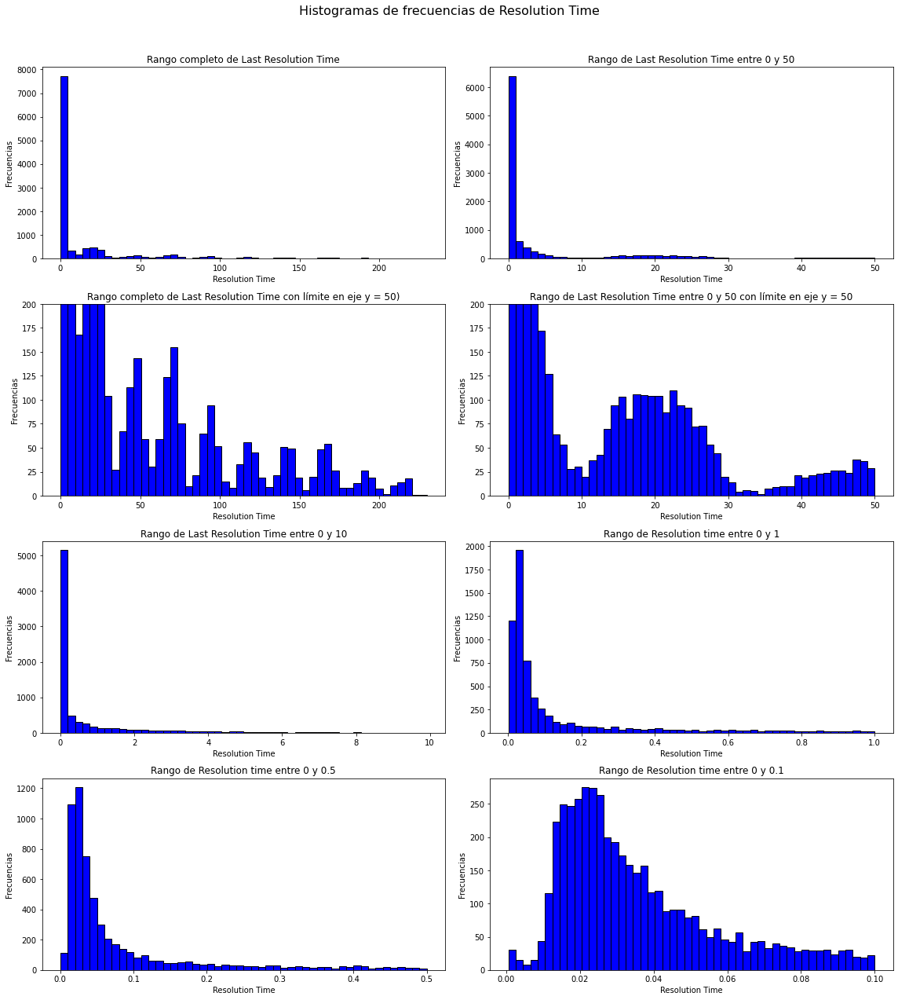

In [14]:
fig, axes = plt.subplots(4, 2, figsize=(16, 18))
fig.suptitle('Histogramas de frecuencias de Resolution Time', fontsize=16)

#Rango completo de Last Resolution Time
axes[0, 0].hist(combined_df['Last Resolution Time'], bins=50, color='blue', edgecolor='black')
axes[0, 0].set_title('Rango completo de Last Resolution Time')
axes[0, 0].set_xlabel('Resolution Time')
axes[0, 0].set_ylabel('Frecuencias')

#Rango de Last Resolution Time entre 0 y 50
range_df = combined_df[(combined_df['Last Resolution Time'] <= 50)]
axes[0, 1].hist(range_df['Last Resolution Time'], bins=50, color='blue', edgecolor='black')
axes[0, 1].set_title('Rango de Last Resolution Time entre 0 y 50')
axes[0, 1].set_xlabel('Resolution Time')
axes[0, 1].set_ylabel('Frecuencias')

#Rango completo de Last Resolution Time con límite en eje y = 200)
axes[1, 0].hist(combined_df['Last Resolution Time'], bins=50, color='blue', edgecolor='black')
axes[1, 0].set_title('Rango completo de Last Resolution Time con límite en eje y = 50)')
axes[1, 0].set_xlabel('Resolution Time')
axes[1, 0].set_ylabel('Frecuencias')
axes[1, 0].set_ylim(0, 200)  # Establecer límite en el eje y a 100

#Rango de Last Resolution Time entre 0 y 50 con límite en eje y = 200
range_df = combined_df[(combined_df['Last Resolution Time'] <= 50)]
axes[1, 1].hist(range_df['Last Resolution Time'], bins=50, color='blue', edgecolor='black')
axes[1, 1].set_title('Rango de Last Resolution Time entre 0 y 50 con límite en eje y = 50')
axes[1, 1].set_xlabel('Resolution Time')
axes[1, 1].set_ylabel('Frecuencias')
axes[1, 1].set_ylim(0, 200)  # Establecer límite en el eje y a 100

#Rango de Last Resolution Time entre 0 y 10
range_df = combined_df[(combined_df['Last Resolution Time'] <= 10)]
axes[2, 0].hist(range_df['Last Resolution Time'], bins=50, color='blue', edgecolor='black')
axes[2, 0].set_title('Rango de Last Resolution Time entre 0 y 10')
axes[2, 0].set_xlabel('Resolution Time')
axes[2, 0].set_ylabel('Frecuencias')

#Rango de Last Resolution Time entre 0 y 1
range_df = combined_df[(combined_df['Last Resolution Time'] <= 1)]
axes[2, 1].hist(range_df['Last Resolution Time'], bins=50, color='blue', edgecolor='black')
axes[2, 1].set_title('Rango de Resolution time entre 0 y 1')
axes[2, 1].set_xlabel('Resolution Time')
axes[2, 1].set_ylabel('Frecuencias')

#Rango de Last Resolution Time entre 0 y 0.5
range_df = combined_df[(combined_df['Last Resolution Time'] <= 0.5)]
axes[3, 0].hist(range_df['Last Resolution Time'], bins=50, color='blue', edgecolor='black')
axes[3, 0].set_title('Rango de Resolution time entre 0 y 0.5')
axes[3, 0].set_xlabel('Resolution Time')
axes[3, 0].set_ylabel('Frecuencias')

#Rango de Last Resolution Time entre 0 y 0.1
range_df = combined_df[(combined_df['Last Resolution Time'] <= 0.1)]
axes[3, 1].hist(range_df['Last Resolution Time'], bins=50, color='blue', edgecolor='black')
axes[3, 1].set_title('Rango de Resolution time entre 0 y 0.1')
axes[3, 1].set_xlabel('Resolution Time')
axes[3, 1].set_ylabel('Frecuencias')

fig.tight_layout(rect=[0, 0, 1, 0.96])

# Mostrar los subgráficos
plt.show()


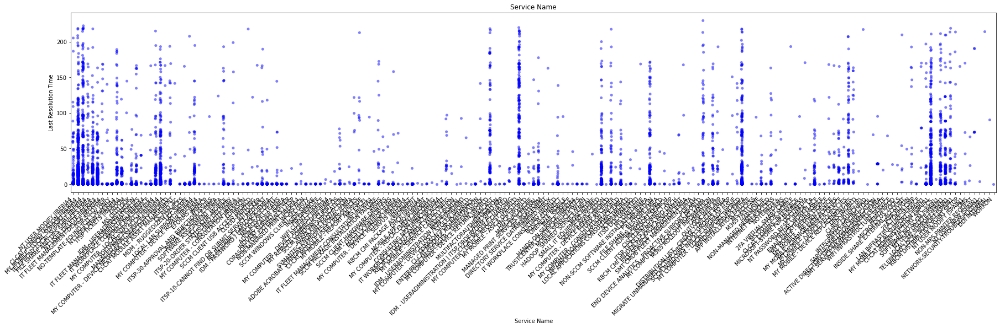

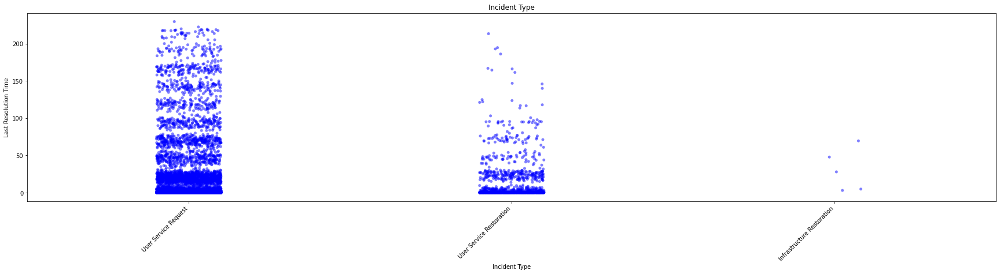

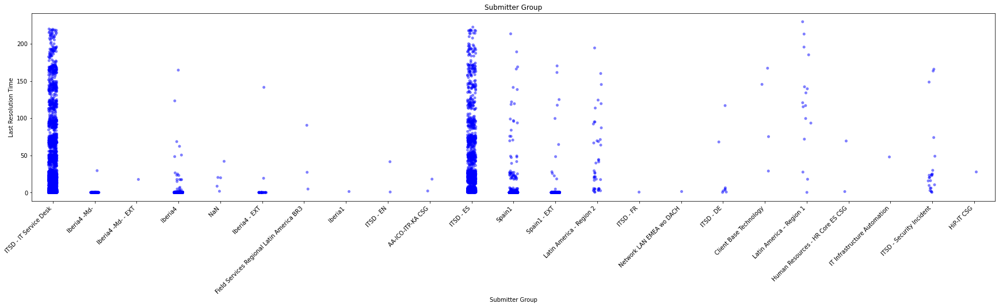

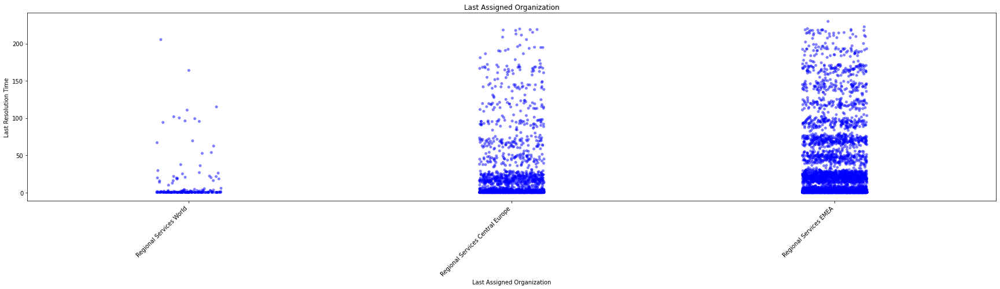

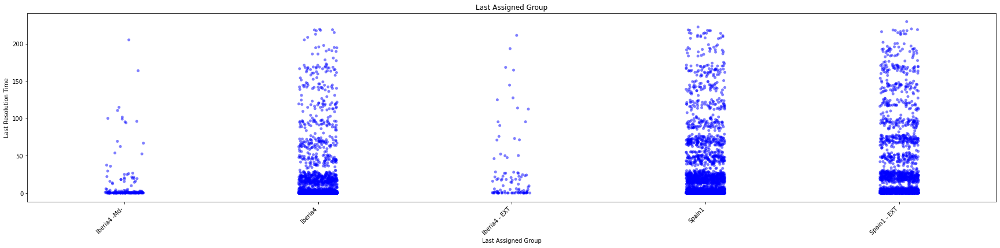

...

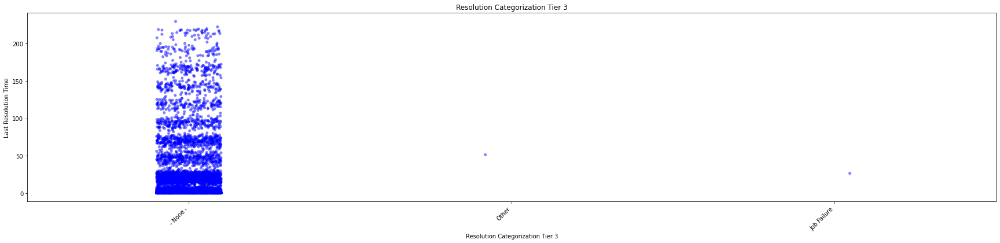

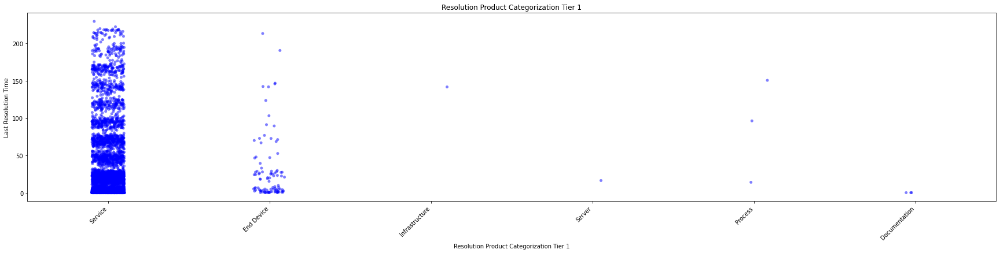

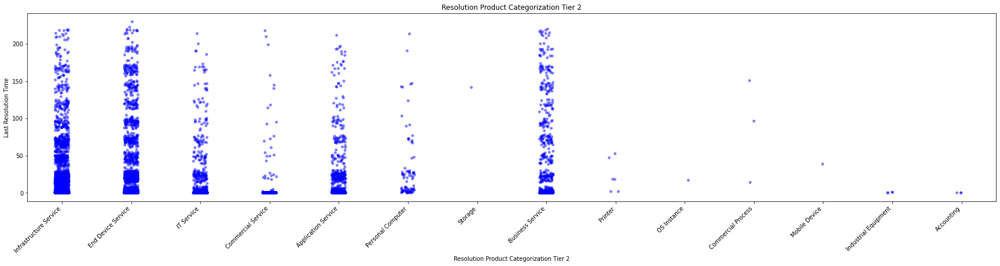

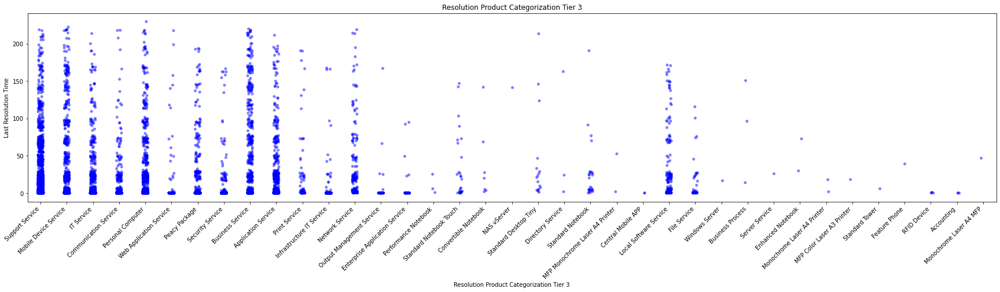

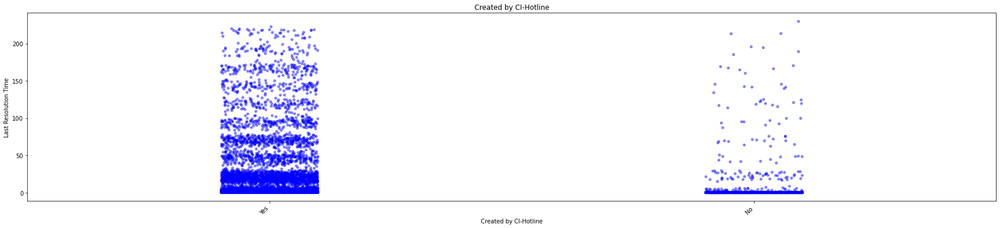

In [15]:
plot_df = combined_df.drop(columns=['Incident Number'])

target_column = 'Last Resolution Time'

for column in plot_df.columns:
    if column != target_column:
        # Crear un gráfico de dispersión
        plt.figure(figsize=(30, 6))
        ax = sns.stripplot(x=column, y=target_column, data=plot_df, jitter=True, alpha=0.5, color='blue')
        plt.title(column)
        plt.xlabel(column)
        plt.ylabel(target_column)

        # Rotar las etiquetas del eje x
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

        plt.show()

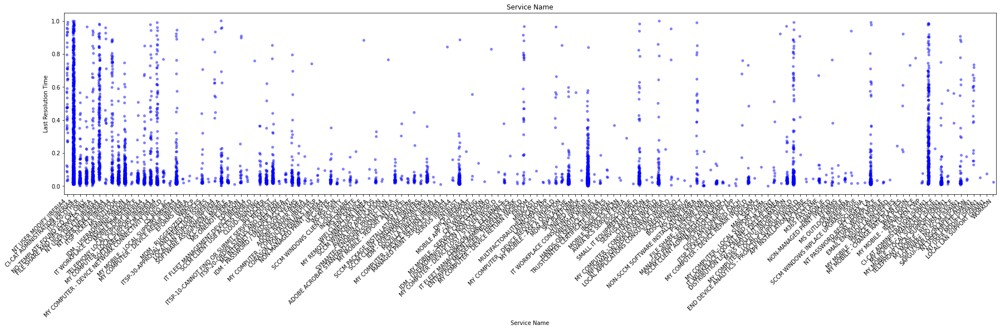

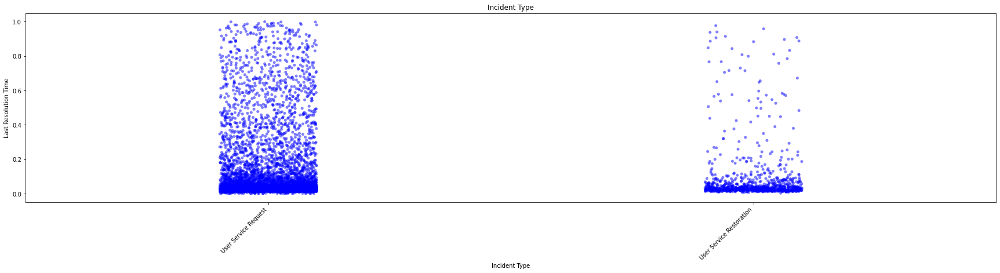

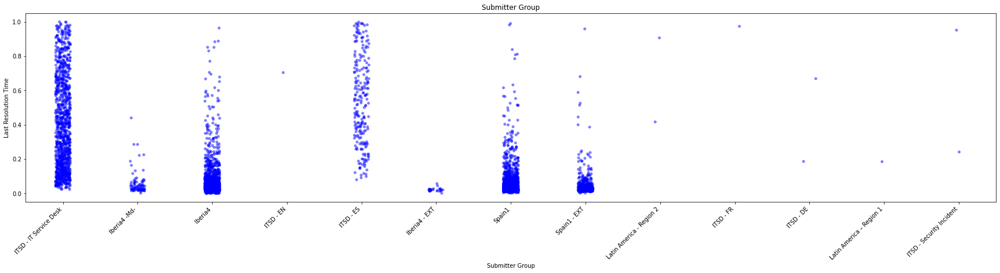

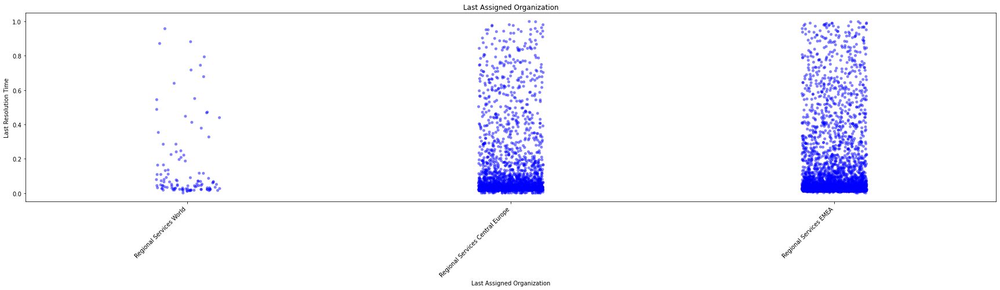

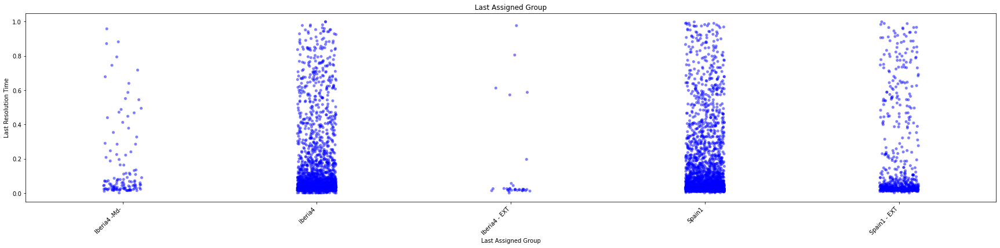

...

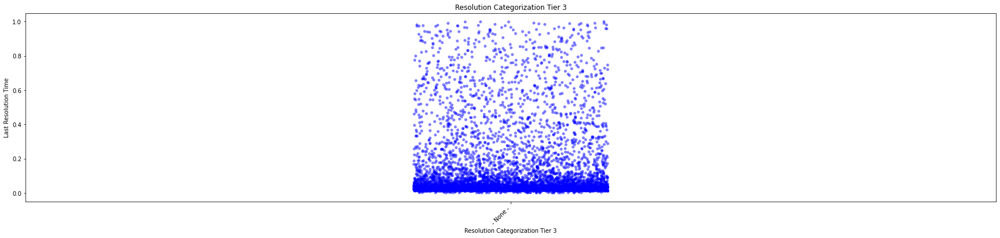

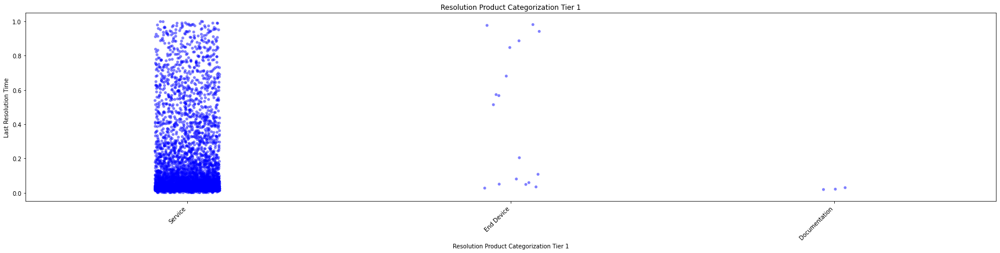

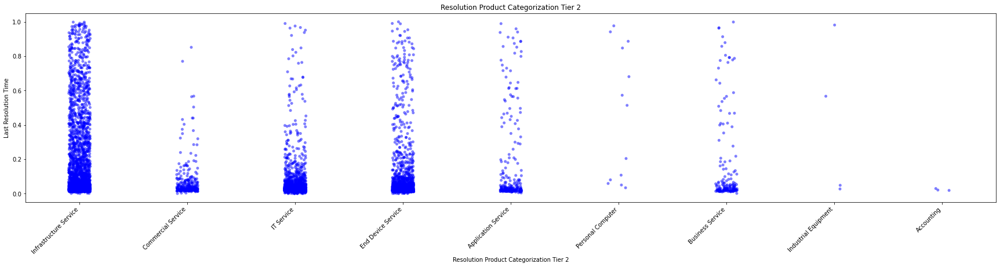

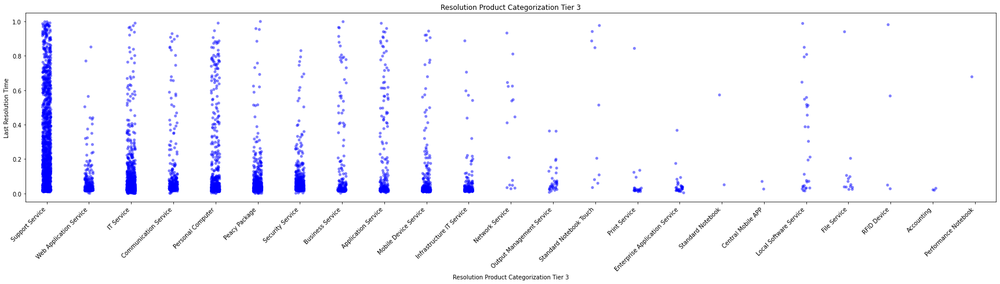

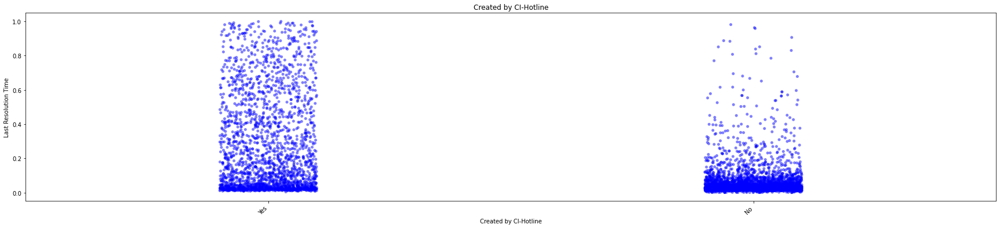

In [16]:
plot_df = plot_df[plot_df['Last Resolution Time'] <= 1]

target_column = 'Last Resolution Time'

for column in plot_df.columns:
    if column != target_column:
        # Crear un gráfico de dispersión
        plt.figure(figsize=(30, 6))
        ax = sns.stripplot(x=column, y=target_column, data=plot_df, jitter=True, alpha=0.5, color='blue')
        plt.title(column)
        plt.xlabel(column)
        plt.ylabel(target_column)

        # Rotar las etiquetas del eje x
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

        plt.show()